
# 🐼 Pandas Foundations for Hospital Data Analysis
## A Beautiful, Step-by-Step Warm-up Before the Analytics Notebook

---

| | |
|:---|:---|
| **Course** | Introduction to Data Science |
| **Notebook purpose** | Learn the pandas commands you need before the full hospital analytics notebook |
| **Data** | A tiny hospital demo CSV with a few realistic data-quality issues |
| **Learning style** | Command → simple example → output → why it matters |
| **Goal** | Make students comfortable with the pandas syntax used later in the analytics notebook |

---

> **Teaching idea:** This notebook is intentionally simple. It teaches the **pandas language** first, so the larger analytics notebook feels familiar instead of overwhelming.


> **Notebook design note:** This notebook includes embedded visual cheatsheets. Students can read the code, see the output, and also view a picture that summarizes what each command is doing.


## 📋 Table of Contents

1. Why this notebook comes first
2. Load the demo CSV with `pd.read_csv()`
3. Read and inspect data with `head`, `tail`, `shape`, `columns`, `dtypes`, `info`, `describe`
4. Select rows and columns with `[]`, `loc`, and `iloc`
5. Find missing values and convert data types with `isna` and `pd.to_numeric`
6. Clean strings, remove duplicates, and fix invalid values with `map`, `between`, and `loc`
7. Fill missing values with `fillna`
8. Summarize and compare groups with `value_counts`, `groupby`, `agg`, and `sort_values`
9. Create new columns and save the result with `to_csv`
10. Command map: how this notebook connects to the full analytics notebook


<div style="text-align:center; margin: 14px 0 18px 0;">
  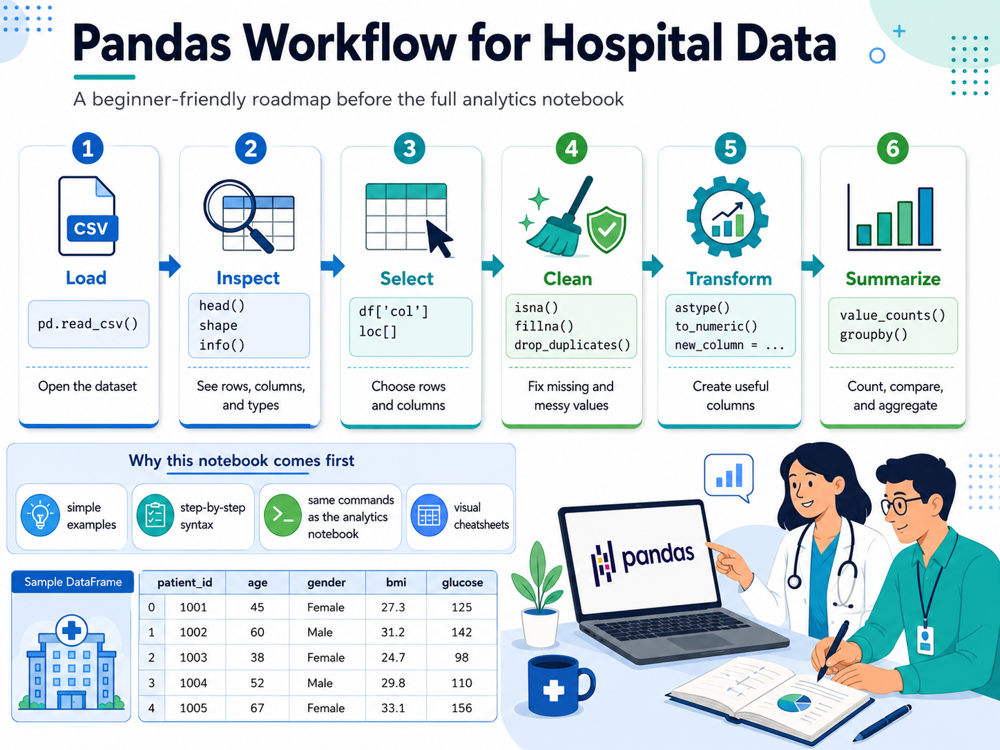
  <p style="margin-top:10px; font-size:15px; color:#374151;"><strong>Figure 1. Pandas Workflow for Hospital Data</strong><br><span style="font-size:14px; color:#4b5563;">A visual roadmap of the pandas skills students will use before moving to the larger hospital analytics project.</span></p>
</div>


---
## 1. Why this notebook comes first

The full analytics notebook is rich and realistic. That is great for learning **data science thinking**, but it also uses many pandas commands at once.

This notebook slows things down. We use a **tiny patient file** and focus on the pandas commands themselves.

### By the end of this notebook, students should be comfortable with:

- loading a CSV file
- looking at rows and columns
- checking missing values
- cleaning messy categories
- selecting data with `loc` and `iloc`
- grouping and counting values
- creating new columns
- saving a cleaned file


In [ ]:
# Setup
import pandas as pd
import numpy as np
from IPython.display import display

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 120)
pd.set_option('display.max_rows', 20)



---
## 2. Load the demo CSV

The file `patients_tiny_demo.csv` is a very small hospital dataset. It is intentionally a little messy so we can practice the same cleaning ideas used later in the analytics notebook.


In [ ]:
# Load the demo file
DATA_PATH = 'patients_tiny_demo.csv'
df_raw = pd.read_csv(DATA_PATH)

print(f'Loaded file: {DATA_PATH}')
print(f'Rows, columns: {df_raw.shape}')
display(df_raw)


#### 🧠 Teaching note
A pandas **DataFrame** is a table. Each row is a patient record, and each column is a variable such as age, BMI, glucose, or smoker status.

<div style="text-align:center; margin: 14px 0 18px 0;">
  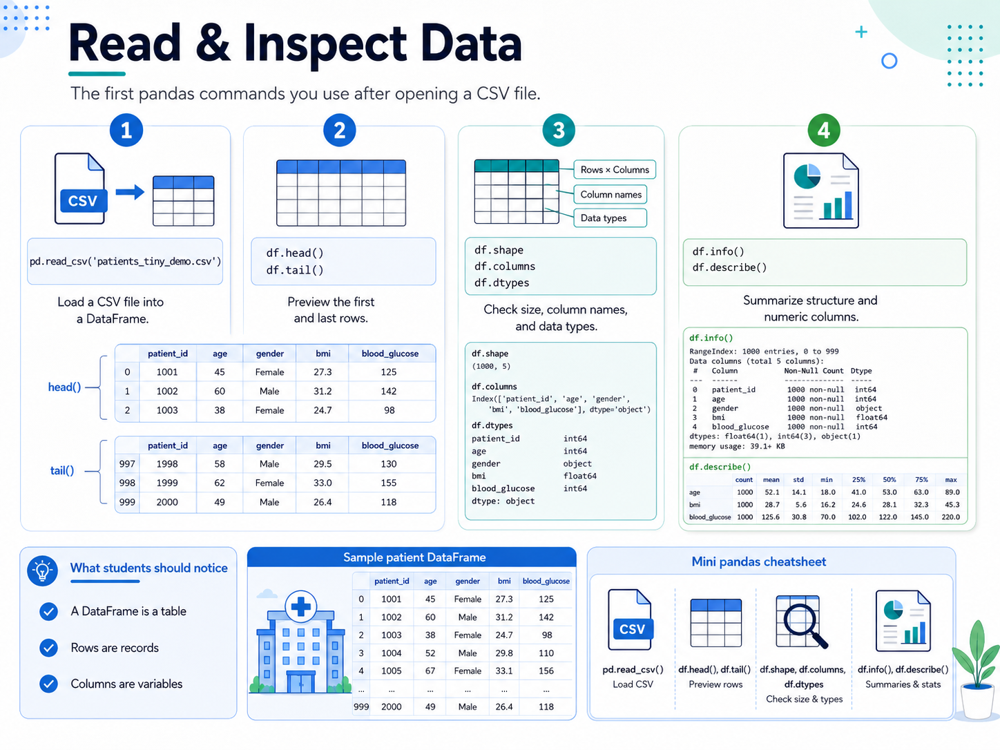
  <p style="margin-top:10px; font-size:15px; color:#374151;"><strong>Figure 2. Read & Inspect Data Cheatsheet</strong><br><span style="font-size:14px; color:#4b5563;">The first commands students normally use after loading a CSV: preview rows, check size, and inspect data types.</span></p>
</div>


---
## 3. Read & Inspect Data

These commands help us answer simple questions first:

- Did the file load correctly?
- What do the first rows look like?
- How many rows and columns do we have?
- What are the column names?
- Which columns are numeric and which are text?


In [ ]:
# Preview the first and last rows
print('First 5 rows:')
display(df_raw.head())

print('Last 5 rows:')
display(df_raw.tail())


In [ ]:
# Basic structure checks
print('Shape:', df_raw.shape)
print()
print('Column names:')
print(df_raw.columns.tolist())
print()
print('Data types:')
display(df_raw.dtypes)


In [ ]:
# Structural summaries
print('Output of df.info():')
df_raw.info()
print()
print('Output of df.describe(include="all"):')
print()
display(df_raw.describe(include='all'))



#### 🧠 What to notice

- `head()` and `tail()` help you quickly preview the table.
- `shape` tells you `(rows, columns)`.
- `columns` tells you the variable names.
- `dtypes` and `info()` tell you whether pandas sees a column as numeric or text.
- `describe()` gives summary statistics for numeric columns and frequency-style summaries for object columns.


<div style="text-align:center; margin: 14px 0 18px 0;">
  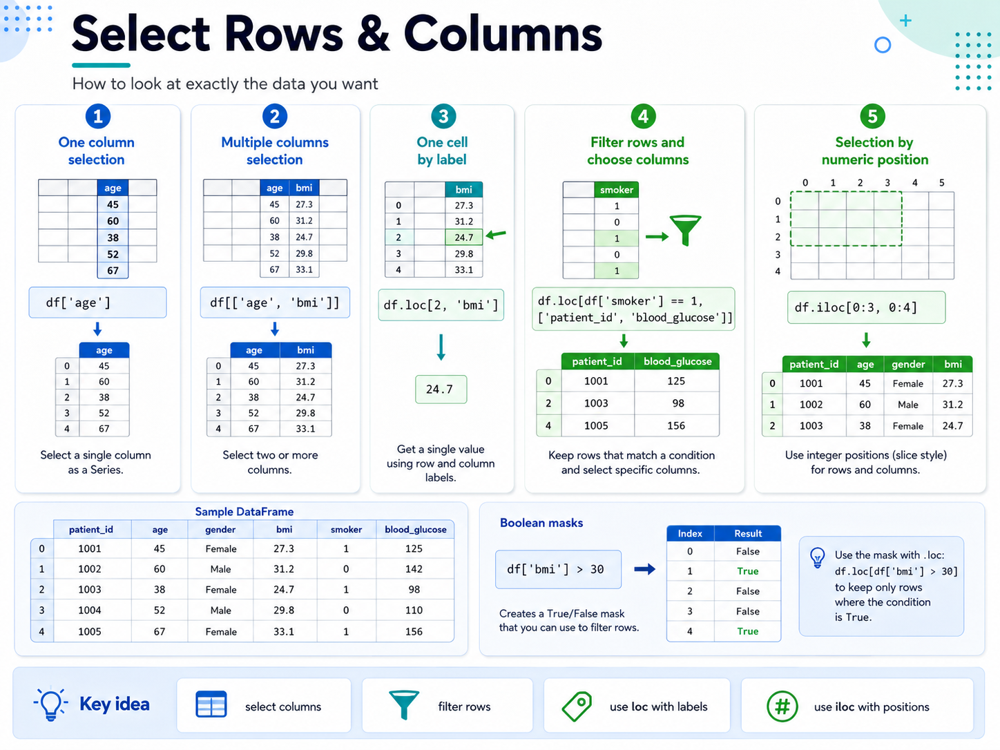
  <p style="margin-top:10px; font-size:15px; color:#374151;"><strong>Figure 3. Select Rows & Columns Cheatsheet</strong><br><span style="font-size:14px; color:#4b5563;">A visual reference for column selection, row filtering, cell access with `loc`, and position-based selection with `iloc`.</span></p>
</div>


---
## 4. Select Rows & Columns

Selecting data is one of the most common pandas skills. We often want:

- one column
- a few columns
- one specific cell
- rows that satisfy a condition
- rows and columns by numeric position


In [ ]:
# One column and multiple columns
print("One column: df_raw['age']")
display(df_raw['age'])

print("Multiple columns: df_raw[['age', 'bmi']]")
display(df_raw[['age', 'bmi']])


In [ ]:
# Select by label with loc
print("One cell by label: df_raw.loc[2, 'bmi']")
display(df_raw.loc[2, 'bmi'])

print("Rows where smoker == 1, and only patient_id and blood_glucose columns:")
display(df_raw.loc[df_raw['smoker'] == 1, ['patient_id', 'blood_glucose']])


In [ ]:
# Select by numeric position with iloc
print('First 3 rows and first 4 columns:')
display(df_raw.iloc[0:3, 0:4])

print("Boolean mask example: df_raw['smoker'] == 1")
mask = df_raw['smoker'] == 1
display(mask)



#### 🧠 What to notice

- `df['col']` selects one column.
- `df[['col1', 'col2']]` selects multiple columns.
- `loc` uses **row and column labels**.
- `iloc` uses **numeric positions**.
- A Boolean mask is a Series of `True` and `False` values that pandas can use to filter rows.


<div style="text-align:center; margin: 14px 0 18px 0;">
  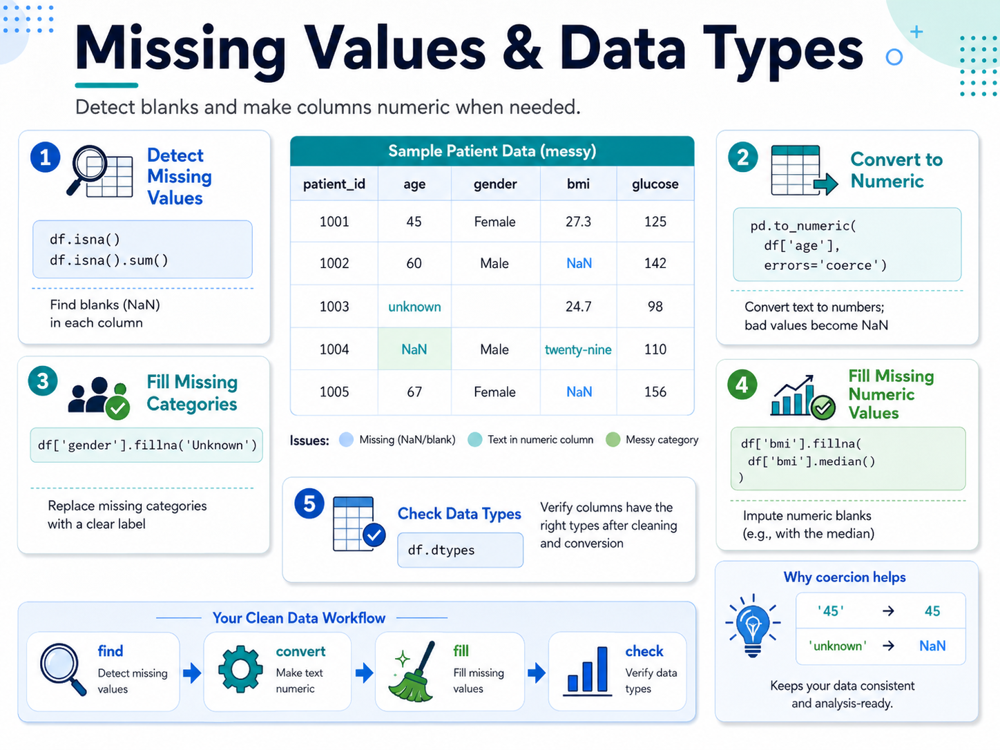
  <p style="margin-top:10px; font-size:15px; color:#374151;"><strong>Figure 4. Missing Values & Data Types Cheatsheet</strong><br><span style="font-size:14px; color:#4b5563;">A visual summary of how to detect blanks, convert text to numeric values, and fill missing data in a simple teaching example.</span></p>
</div>


---
## 5. Missing Values & Data Types

Before analysis, we usually check for two common problems:

1. **Missing values** (`NaN`)
2. **Wrong data types** (for example, a number stored as text)


In [ ]:
# Missing values
print('Missing-value mask from df_raw.isna():')
display(df_raw.isna())

print('Missing values per column from df_raw.isna().sum():')
display(df_raw.isna().sum())


In [ ]:
# Convert numeric-looking columns to numeric types
numeric_cols = [
    'patient_id', 'age', 'bmi', 'systolic_bp', 'cholesterol',
    'blood_glucose', 'smoker', 'exercise_hrs', 'has_disease'
]

df_num = df_raw.copy()
for col in numeric_cols:
    df_num[col] = pd.to_numeric(df_num[col], errors='coerce')

print('Data types after pd.to_numeric(..., errors="coerce"):')
print()
display(df_num.dtypes)


In [ ]:
# Look at rows where conversion created NaN values
print('Rows where age, bmi, or blood_glucose became NaN after conversion:')
problem_view = df_num.loc[:, ['patient_id', 'age', 'bmi', 'blood_glucose']]
display(problem_view)



#### 🧠 Why `errors='coerce'` is useful

If pandas cannot convert a value to a number, it turns that value into `NaN`.

Examples:

- `'45'` → `45`
- `'unknown'` → `NaN`
- `'twenty-nine'` → `NaN`
- `'not measured'` → `NaN`

This is helpful because it gives us a consistent way to handle bad values later.


<div style="text-align:center; margin: 14px 0 18px 0;">
  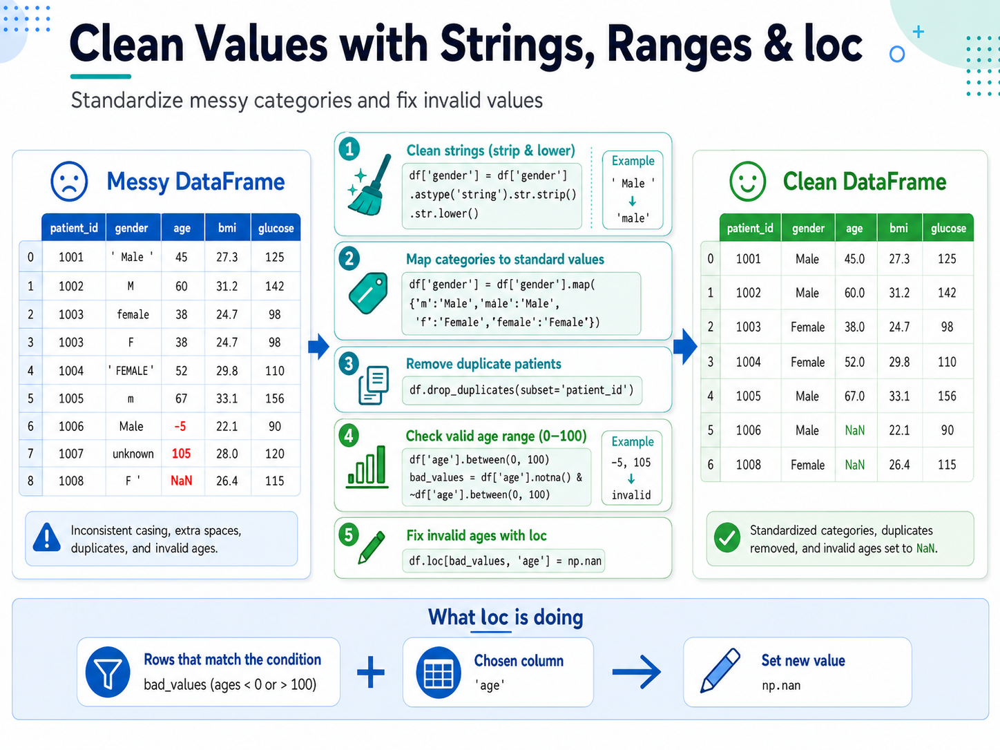
  <p style="margin-top:10px; font-size:15px; color:#374151;"><strong>Figure 5. Clean Values with Strings, Ranges & loc</strong><br><span style="font-size:14px; color:#4b5563;">This cheatsheet connects string cleaning, category mapping, duplicate removal, range checks, and `loc` updates in one visual flow.</span></p>
</div>


---
## 6. Clean Strings, Remove Duplicates, and Fix Invalid Values

Now we practice the same style of cleaning used in the larger analytics notebook.

### Goals in this section

- standardize `gender`
- remove duplicate patients
- identify impossible numeric values
- use `loc` to replace invalid values with `NaN`


In [ ]:
# Start from the numeric-converted DataFrame
# We keep text columns like gender as text, but numeric columns are already converted.
df_clean = df_num.copy()

print('Raw category counts before cleaning:')
display(df_clean['gender'].value_counts(dropna=False))
print()
print('Same values shown with repr() to reveal extra spaces:')
display(df_clean['gender'].map(repr).value_counts(dropna=False))


In [ ]:
# Clean the gender column: strip spaces, lower-case, then map to standard labels
df_clean['gender'] = (
    df_clean['gender']
    .astype('string')
    .str.strip()
    .str.lower()
)

gender_map = {
    'm': 'Male', 'male': 'Male',
    'f': 'Female', 'female': 'Female'
}

df_clean['gender'] = df_clean['gender'].map(gender_map)

print('Gender counts after cleaning and mapping:')
display(df_clean['gender'].value_counts(dropna=False))


In [ ]:
# Find duplicates and then remove them
print('Duplicate rows based on patient_id:')
display(df_clean[df_clean.duplicated(subset='patient_id', keep=False)])

df_clean = df_clean.drop_duplicates(subset='patient_id', keep='first')
print('Shape after removing duplicate patient_id rows:', df_clean.shape)


In [ ]:
# Range checking and invalid values
valid_ranges = {
    'age': (0, 100),
    'bmi': (10, 70),
    'systolic_bp': (70, 250),
    'cholesterol': (100, 400),
    'blood_glucose': (50, 300),
    'exercise_hrs': (0, 40)
}

bad_age_values = df_clean['age'].notna() & ~df_clean['age'].between(0, 100)
print('Boolean mask for invalid ages:')
display(bad_age_values)
print()
print('Rows with invalid ages:')
display(df_clean.loc[bad_age_values, ['patient_id', 'age']])


In [ ]:
# Replace invalid values with NaN using loc
for col, (lo, hi) in valid_ranges.items():
    bad_values = df_clean[col].notna() & ~df_clean[col].between(lo, hi)
    df_clean.loc[bad_values, col] = np.nan

print('Missing values after converting invalid values to NaN:')
display(df_clean.isna().sum())



#### 🧠 What `loc` is doing

When we write:

`df_clean.loc[bad_values, 'age'] = np.nan`

we mean:

- choose the rows where `bad_values` is `True`
- choose the column `'age'`
- replace those selected cells with `NaN`



---
## 7. Fill Missing Values with `fillna`

After cleaning, some values are still missing. We now fill them with simple teaching-friendly rules:

- text category (`gender`) → fill with `'Unknown'`
- numeric columns → fill with the column median


In [ ]:
print('Missing values before fillna:')
display(df_clean.isna().sum())


In [ ]:
# Fill missing categories
df_clean['gender'] = df_clean['gender'].fillna('Unknown')

# Fill missing numeric columns with the median
fill_numeric_cols = ['age', 'bmi', 'blood_glucose', 'exercise_hrs']
for col in fill_numeric_cols:
    df_clean[col] = df_clean[col].fillna(df_clean[col].median())

print('Missing values after fillna:')
display(df_clean.isna().sum())


In [ ]:
print('Cleaned demo DataFrame:')
display(df_clean)


#### 🧠 Teaching note
`fillna()` does not mean there is only one correct answer. In real projects, the choice of how to fill missing values depends on the context and should be documented clearly.

<div style="text-align:center; margin: 14px 0 18px 0;">
  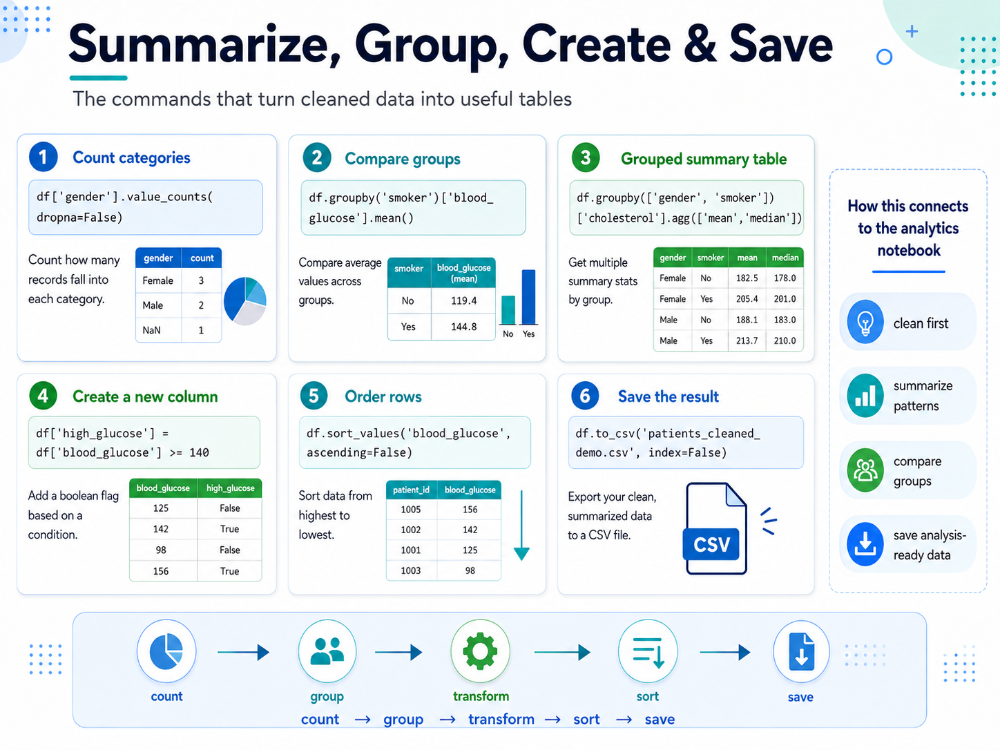
  <p style="margin-top:10px; font-size:15px; color:#374151;"><strong>Figure 6. Summarize, Group, Create & Save</strong><br><span style="font-size:14px; color:#4b5563;">A compact cheatsheet for counting categories, grouping data, creating simple derived columns, sorting rows, and saving the cleaned result.</span></p>
</div>


---
## 8. Summarize, Compare Groups, Create New Columns, and Save the Result

Once data is clean enough, we can start making useful summary tables.


In [ ]:
# Count categories
print('Gender counts:')
display(df_clean['gender'].value_counts(dropna=False))

print('Smoker counts:')
display(df_clean['smoker'].value_counts(dropna=False))


In [ ]:
# Groupby examples
print('Average blood glucose by smoker status:')
display(df_clean.groupby('smoker')['blood_glucose'].mean())

print('Mean and median cholesterol by gender and smoker status:')
display(
    df_clean.groupby(['gender', 'smoker'])['cholesterol']
    .agg(['mean', 'median'])
)


In [ ]:
# Create simple derived columns
df_clean['high_glucose'] = df_clean['blood_glucose'] >= 140
df_clean['is_high_bp'] = df_clean['systolic_bp'] >= 140

def age_band(age):
    if age < 40:
        return 'Under 40'
    elif age < 60:
        return '40-59'
    else:
        return '60+'

df_clean['age_group'] = df_clean['age'].apply(age_band)

print('DataFrame with new columns:')
display(df_clean[['patient_id', 'age', 'age_group', 'blood_glucose', 'high_glucose', 'systolic_bp', 'is_high_bp']])


In [ ]:
# Sort rows and save the cleaned result
print('Patients sorted by blood_glucose (highest first):')
display(df_clean.sort_values('blood_glucose', ascending=False)[['patient_id', 'blood_glucose', 'gender', 'smoker']])

OUTPUT_PATH = 'patients_tiny_cleaned_demo.csv'
df_clean.to_csv(OUTPUT_PATH, index=False)
print(f'Saved cleaned demo file to: {OUTPUT_PATH}')



---
## 9. Command Map — How This Notebook Connects to the Full Analytics Notebook

| Pandas command | What it does | Why it matters later |
|:---|:---|:---|
| `pd.read_csv()` | loads the CSV into a DataFrame | the analytics notebook starts by loading patient data |
| `head()`, `tail()` | previews rows | useful during EDA |
| `shape`, `columns`, `dtypes`, `info()` | inspects structure and types | helps diagnose messy data |
| `isna()`, `isna().sum()` | finds missing values | used before cleaning |
| `pd.to_numeric(..., errors='coerce')` | converts text to numbers and turns bad values into `NaN` | important for numeric analysis |
| `.str.strip()`, `.str.lower()`, `.map()` | standardizes messy categories | used to clean columns like `gender` |
| `drop_duplicates()` | removes repeated records | important for patient-level data |
| `between()` | checks valid numeric ranges | helps detect implausible values |
| `loc[...] = ...` | changes selected cells | used to set invalid values to `NaN` |
| `fillna()` | fills missing values | creates analysis-ready data |
| `value_counts()` | counts category frequencies | useful for quick summaries |
| `groupby()` and `agg()` | compares groups and calculates summaries | central to EDA and feature analysis |
| `sort_values()` | orders rows | helpful for ranking or inspection |
| `to_csv()` | saves the cleaned result | useful for downstream analysis |
